<a href="https://colab.research.google.com/github/noreenanwar/research/blob/master/demo/MMDet_Tutorial1.6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection

In this tutorial, you will learn:
- the basic structure of Faster R-CNN.
- to perform inference with a MMDetection detector.
- to train a new detector with a new dataset.

Let's start!


## Install MMDetection

In [12]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_Mar__8_18:18:20_PST_2022
Cuda compilation tools, release 11.6, V11.6.124
Build cuda_11.6.r11.6/compiler.31057947_0
gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [13]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
Cloning into 'mmdetection'...
remote: Enumerating objects: 34119, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 34119 (delta 5), reused 6 (delta 1), pack-reused 34094
Receiving objects: 100% (34119/34119), 45.56 MiB | 17.23 MiB/s, done.
Resolving deltas: 100% (24097/24097), done.
/content/mmdetection/mmdetection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection/mmdetection
  Preparing metadata (setup.py) ... done
  Attempting uninstall: mmdet
    Found existing installation: mmdet 2.28

In [14]:
from mmcv import collect_env
collect_env()

{'sys.platform': 'linux',
 'Python': '3.8.10 (default, Nov 14 2022, 12:59:47) [GCC 9.4.0]',
 'CUDA available': True,
 'GPU 0': 'Tesla T4',
 'CUDA_HOME': '/usr/local/cuda',
 'NVCC': 'Cuda compilation tools, release 11.6, V11.6.124',
 'GCC': 'x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0',
 'PyTorch': '1.9.0+cu111',
 'PyTorch compiling details': 'PyTorch built with:\n  - GCC 7.3\n  - C++ Version: 201402\n  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications\n  - Intel(R) MKL-DNN v2.1.2 (Git Hash 98be7e8afa711dc9b66c8ff3504129cb82013cdb)\n  - OpenMP 201511 (a.k.a. OpenMP 4.5)\n  - NNPACK is enabled\n  - CPU capability usage: AVX2\n  - CUDA Runtime 11.1\n  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute_80,code=sm_80;-gencode;arch=compute_

In [26]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True
2.28.1
11.1
GCC 7.3


In [19]:
from google.colab import drive
drive.mount('/content/drive')
import shutil
shutil.copy("/content/drive/MyDrive/MOT17.mp4","/content/mmdetection/demo")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: ignored

In [34]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth \
-O checkpoints/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth

--2023-02-15 21:55:03--  https://download.openmmlab.com/mmdetection/v2.0/centernet/centernet_resnet18_dcnv2_140e_coco/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.81.214, 163.181.81.210, 163.181.81.213, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.81.214|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 57832952 (55M) [application/octet-stream]
Saving to: ‘checkpoints/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth’

checkpoints/centern 100%[===================>]  55.15M   206MB/s    in 0.3s    

2023-02-15 21:55:03 (206 MB/s) - ‘checkpoints/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth’ saved [57832952/57832952]



In [30]:
pwd

'/content/mmdetection'

In [49]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/centernet/me.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

load checkpoint from local path: checkpoints/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth


CenterNet(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_ru

In [23]:
import torch
import numpy as np

# Load a pre-trained Centernet model
model = torch.load('/content/drive/MyDrive/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth')



In [ ]:
import torch
import numpy as np

# Load a pre-trained CentrNet model
model = torch.load('/content/drive/MyDrive/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth')

# Define a hook to extract activations from intermediate layers
activations = []
def hook(module, input, output):
    activations.append(output)

# Register the hook on each layer of the model
handle = []
for name, module in model.named_children():
    handle.append(module.register_forward_hook(hook))

# Forward pass through the model with a sample input
input = torch.rand(1, 3, 224, 224)
model(input)

# Remove the hooks


AttributeError: ignored

In [ ]:
import torch
import torch.nn as nn

# Load a pre-trained model
model = torch.load('/content/drive/MyDrive/centernet_resnet18_dcnv2_140e_coco_20210702_155131-c8cd631f.pth') # load your pre-trained model here

# Define a hook to extract activations
def get_activations(module, input, output):
    activations = output.detach().cpu().numpy()
    # Do something with the activations here, such as saving them to disk

# Register the hook on the desired layer
handle = model.layer_you_want_to_extract_from.register_forward_hook(get_activations)

# Forward a batch of data through the network
input_data = ... # your input data here
model(input_data)

# Remove the hook
handle.remove()


AttributeError: ignored

In [ ]:
import torch
import torchvision

# Load a pre-trained ResNet50 model
model = torchvision.models.resnet50(pretrained=True)

# Define a single input image tensor
input_tensor = torch.randn(1, 3, 224, 224)

# Set the model to evaluation mode
model.eval()

# Use hooks to extract activations from the intermediate layers
activations = {}
def hook_fn(module, input, output):
    activations[module] = output

# Register hooks for each layer you want to extract activations from
for module in model.named_children():
    if module[0] == 'layer_you_want_to_extract_from':
        module[1].register_forward_hook(hook_fn)

# Forward pass through the model
with torch.no_grad():
    model(input_tensor)

# Store the activations as a PyTorch tensor
torch.save(activations, 'activations.pt')



In [ ]:
import mmcv
from mmdet.models import build_detector

# Load the pre-trained model
#model = build_detector('centernet', train_cfg=None, test_cfg=None)

# Define the input tensor
input_tensor = torch.randn(1, 3, 224, 224)

# Extract activations from the model
activations = []
def hook(module, input, output):
    activations.append(output)

handles = []
for name, module in model.named_modules():
    if name in ['layer1', 'layer2', 'layer3', 'layer4']:
        handle = module.register_forward_hook(hook)
        handles.append(handle)

with torch.no_grad():
    model(input_tensor)

# Store the activations as a Torch tensor
torch.save(activations, 'activations1.pt')

# Remove the hook
for handle in handles:
    handle.remove()



In [ ]:
import torch
import torchvision
import numpy as np

# Load the activations from the .pt file
activations = torch.load('activations1.pt')

print(activations.keys())


# Convert the activations to a Numpy array
#activations = activations.detach().numpy()
#tensor = activations['activations']
#activations = tensor.detach().numpy()


# Define the Siamese network
class SiameseNetwork(torch.nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.fc = torch.nn.Linear(512, 256)

    def forward(self, x1, x2):
        x1 = self.fc(x1)
        x2 = self.fc(x2)
        return torch.nn.functional.cosine_similarity(x1, x2)

# Initialize the Siamese network
model = SiameseNetwork()

# Define a loss function
criterion = torch.nn.MSELoss()

# Define an optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

# Split the activations into two sets
num_samples = activations.shape[0]
activations1 = activations[:num_samples//2]
activations2 = activations[num_samples//2:]

# Train the Siamese network
for epoch in range(100):
    # Zero the gradients
    optimizer.zero_grad()

    # Forward pass
    outputs = model(activations1, activations2)

    # Compute the loss
    labels = torch.ones(num_samples//2)
    loss = criterion(outputs, labels)

    # Backward pass
    loss.backward()

    # Update the parameters
    optimizer.step()

    # Print the loss
    print('Epoch [{}/100], Loss: {:.4f}'.format(epoch+1, loss.item()))


AttributeError: ignored

In [ ]:
import torch
import numpy as np

# Load the activations from the .pt file
activations = torch.load('activations1.pt')
activationss = torch.tensor(activations)

print("Type of activations: ", type(activationss))
print("Shape of activations: ", activationss.shape)

tensor = torch.tensor(activations)
detached_tensor = tensor.detach()
# Convert the activations to a Numpy array
#activations_np = activations.detach().numpy()

# Save the Numpy array to a .npy file
#np.save('activations.npy', activations_np)


ValueError: ignored

In [ ]:
import torch
import torch.nn as nn

class SiameseNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2048, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        
    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.fc2(x)
        x = torch.relu(x)
        x = self.fc3(x)
        return x

# Load pre-trained activations
activations = torch.load('activations.pt')

# Create a Siamese network
siamese_net = SiameseNetwork()

# Define the loss function
criterion = nn.CosineSimilarity(dim=1)

# Train the Siamese network
optimizer = torch.optim.Adam(siamese_net.parameters(), lr=0.001)
for epoch in range(100):
    for i in range(len(activations) - 1):
        activations1 = activations[i]
        activations2 = activations[i+1]
        
        optimizer.zero_grad()
        features1 = siamese_net(activations1)
        features2 = siamese_net(activations2)
        loss = criterion(features1, features2)
        loss.backward()
        optimizer.step()


In [ ]:
import torch

# Load the activations from the .pt file
activations = torch.load('activations1.pt')

# Check the type and shape of the activations tensor
print('Type:', type(activations))
print('Shape:', activations.shape)

# Convert the activations to a Numpy array
activations = activations.detach().numpy()

# Check the type and shape of the activations array
print('Type:', type(activations))
print('Shape:', activations.shape)


Type: <class 'list'>


AttributeError: ignored

In [ ]:
import numpy as np
import torch

# Convert the list to a Numpy array



# Load the activations from the .pt file
activations = torch.load('activations1.pt')
array = np.array(activations)
array = array.astype(np.float32)
#activations = torch.tensor(activations)
#scalar = activations[1].item()
tensor = torch.from_numpy(array)


# Check the type of the loaded activations
print(type(activations))

# If the loaded activations is a list, convert it to a tensor
if type(activations) == list:
  activations = torch.tensor(activations)

# Check the shape of the activations tensor
print(activations.shape)


<ipython-input-51-61253c47939d>:10: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  array = np.array(activations)
<ipython-input-51-61253c47939d>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  array = np.array(activations)


ValueError: ignored

In [ ]:
pwd

'/content/mmdetection'

From the printed model, we will find that the model does consist of the components that we described earlier. It uses ResNet as its CNN backbone, and has a RPN head and RoI Head. In addition, the model has a neural network module, named neck, directly after the CNN backbone. It is a [feature pyramid network (FPN)](https://arxiv.org/abs/1612.03144) for enhancing the multi-scale features.


### Inference the detector

Since the model is successfully created and loaded, let's see how good it is. We use the high-level API `inference_detector` implemented in the MMDetection. This API is created to ease the inference process. The details of the codes can be found [here](https://github.com/open-mmlab/mmdetection/blob/master/mmdet/apis/inference.py#L15).

In [36]:
import cv2
import os

# Path to the video file
video_file = "demo/MOT17.mp4"


# Create a directory to save the images
os.makedirs("frames", exist_ok=True)

# Open the video file
video = cv2.VideoCapture(video_file)
print("nnn")

# Get the total number of frames in the video
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Loop through all the frames in the video
for i in range(total_frames):
    # Read the next frame from the video
    success, frame = video.read()
    
    # If the frame was successfully read, save it as an image
    if success:
        image_file = "frames/frame_{:05d}.jpg".format(i)
        cv2.imwrite(image_file, frame)

# Release the video capture object
video.release()

nnn


In [ ]:
pwd


'/content/mmdetection'

In [50]:
# Let's plot the result
import numpy as np
img = 'frames/frame_00000.jpg'
img2 = 'frames/frame_00001.jpg'
result = inference_detector(model, img)

result_1 = inference_detector(model, img2)
center_heatmap_preds = result[1]
#all_elements = center_heatmap_preds.flatten()
print(center_heatmap_preds)
center_heatmap_preds_1 = result_1[0]
from google.colab.patches import cv2_imshow
show_result_pyplot(model, img, result, score_thr=0.3)
show_result_pyplot(model, img, result_1, score_thr=0.3)
#print(center_heatmap_preds)

#print(center_heatmap_target)
center_heatmap_preds = center_heatmap_preds- np.min(center_heatmap_preds)
center_heatmap_preds = center_heatmap_preds / np.max(center_heatmap_preds)
center_heatmap_preds_1 = center_heatmap_preds_1- np.min(center_heatmap_preds_1)
center_heatmap_preds_1 = center_heatmap_preds_1 / np.max(center_heatmap_preds_1)
#cv2_imshow(center_heatmap_preds)
# Convert the heatmap to an 8-bit unsigned integer representation
#center_heatmap_preds = (center_heatmap_preds * 255).astype(np.uint8)
print(center_heatmap_preds)

print(center_heatmap_preds_1)

# Display the heatmap
cv2_imshow(center_heatmap_preds)
cv2_imshow(center_heatmap_preds_1)
import matplotlib.pyplot as plt

#plt.show()
#cv2.destroyAllWindows()



KeyError: ignored

In [48]:
import torch
import torch.nn as nn

class CenterNetDecoder(nn.Module):
    def __init__(self, num_classes, down_ratio=4):
        super(CenterNetDecoder, self).__init__()

        self.num_classes = num_classes
        self.down_ratio = down_ratio

        self.hm_conv = nn.Conv2d(64, self.num_classes, kernel_size=1, stride=1, padding=0)
        self.wh_conv = nn.Conv2d(64, 2, kernel_size=1, stride=1, padding=0)
        self.reg_conv = nn.Conv2d(64, 2, kernel_size=1, stride=1, padding=0)

        self.hm_act = nn.Sigmoid()

    def forward(self, feats):
        hm = self.hm_conv(feats)
        wh = self.wh_conv(feats)
        reg = self.reg_conv(feats)

        hm = self.hm_act(hm)

        return hm, wh, reg

# Create an instance of the CenterNetDecoder class
decoder = CenterNetDecoder(num_classes=80, down_ratio=4)

# Test the decoder with some random inputs
inputs = torch.randn(1, 64, 128, 128)
outputs = decoder(inputs)

# Print the shape of the output tensors
print("Output Shapes:")
print("HM:", outputs[0].shape)
print("WH:", outputs[1].shape)
print("Reg:", outputs[2].shape)


Output Shapes:
HM: torch.Size([1, 80, 128, 128])
WH: torch.Size([1, 2, 128, 128])
Reg: torch.Size([1, 2, 128, 128])


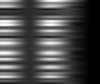

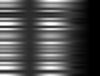

In [ ]:
center_heatmap_preds = center_heatmap_preds - np.min(center_heatmap_preds)
center_heatmap_preds = center_heatmap_preds / np.max(center_heatmap_preds)
center_heatmap_preds = (center_heatmap_preds * 255).astype(np.uint8)
cv2_imshow(center_heatmap_preds)
resized_heatmap = cv2.resize(center_heatmap_preds, (center_heatmap_preds.shape[1]*20, center_heatmap_preds.shape[0]*2), interpolation = cv2.INTER_CUBIC)
cv2_imshow(resized_heatmap)
cv2.waitKey(0)
cv2.destroyAllWindows()


center_heatmap_preds_1 = center_heatmap_preds_1- np.min(center_heatmap_preds_1)
center_heatmap_preds_1 = center_heatmap_preds_1 / np.max(center_heatmap_preds_1)
center_heatmap_preds_1 = (center_heatmap_preds_1 * 255).astype(np.uint8)
cv2_imshow(center_heatmap_preds)
resized_heatmap_1 = cv2.resize(center_heatmap_preds_1, (center_heatmap_preds_1.shape[1]*20, center_heatmap_preds_1.shape[0]*2), interpolation = cv2.INTER_CUBIC)
cv2_imshow(resized_heatmap_1)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2

# CenterNet output is stored in a list or array 'result'
for instance in result:
    instance_heatmap = instance['heatmap']
    # process the heatmap for this instance as needed


IndexError: ignored

In [ ]:
import cv2
import numpy as np

# Normalize the heatmap values to a range between 0 and 1
normalized_heatmap = cv2.normalize(center_heatmap_preds, None, 0, 1, cv2.NORM_MINMAX)

# Convert the heatmap values to a color map
colored_heatmap = cv2.applyColorMap(np.uint8(255 * normalized_heatmap), cv2.COLORMAP_JET)

# Adjust the contrast and brightness of the heatmap
alpha = 1.5
beta = 10
heatmap = cv2.convertScaleAbs(colored_heatmap, alpha=alpha, beta=beta)

# Show the heatmap
cv2_imshow(heatmap)



# Normalize the heatmap values to a range between 0 and 1
normalized_heatmap_1 = cv2.normalize(center_heatmap_preds_1, None, 0, 1, cv2.NORM_MINMAX)

# Convert the heatmap values to a color map
colored_heatmap_1 = cv2.applyColorMap(np.uint8(255 * normalized_heatmap_1), cv2.COLORMAP_JET)

# Adjust the contrast and brightness of the heatmap
alpha = 1.5
beta = 10
heatmap_1 = cv2.convertScaleAbs(colored_heatmap_1, alpha=alpha, beta=beta)

# Show the heatmap
cv2_imshow(heatmap_1)
cv2.waitKey(0)
cv2.destroyAllWindows()

[[[0.         0.0390625  0.94140625]
  [0.         0.0390625  0.94921875]
  [0.         0.0390625  0.953125  ]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 [[0.         0.0390625  0.94921875]
  [0.         0.0390625  0.953125  ]
  [0.         0.0390625  0.95703125]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 [[0.         0.0390625  0.953125  ]
  [0.         0.0390625  0.95703125]
  [0.         0.0390625  0.9609375 ]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 ...

 [[0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]
  ...
  [0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]]

 [[0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]


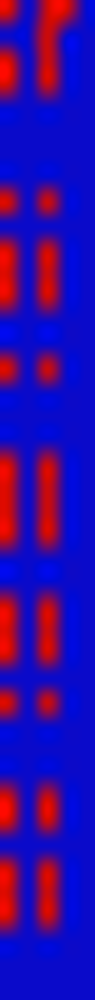

[[[0.         0.0390625  0.94140625]
  [0.         0.0390625  0.94921875]
  [0.         0.0390625  0.953125  ]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 [[0.         0.0390625  0.94921875]
  [0.         0.0390625  0.953125  ]
  [0.         0.0390625  0.95703125]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 [[0.         0.0390625  0.953125  ]
  [0.         0.0390625  0.95703125]
  [0.         0.0390625  0.9609375 ]
  ...
  [0.87890625 0.0390625  0.        ]
  [0.875      0.0390625  0.        ]
  [0.87109375 0.0390625  0.        ]]

 ...

 [[0.         0.0390625  0.953125  ]
  [0.         0.0390625  0.95703125]
  [0.         0.0390625  0.9609375 ]
  ...
  [0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]
  [0.7890625  0.0390625  0.0390625 ]]

 [[0.         0.0390625  0.94921875]
  [0.         0.0390625  0.953125  ]


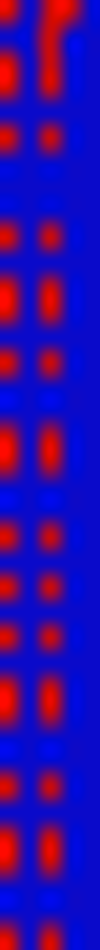

In [ ]:
resized_heatmap = cv2.resize(heatmap, (heatmap.shape[1]*20, heatmap.shape[0]*25), interpolation = cv2.INTER_CUBIC)
print(resized_heatmap/256)
cv2_imshow(resized_heatmap)
cv2.imwrite("heatmap1.jpg", heatmap)

resized_heatmap_1 = cv2.resize(heatmap_1, (heatmap_1.shape[1]*20, heatmap_1.shape[0]*25), interpolation = cv2.INTER_CUBIC)
print(resized_heatmap_1/256)
cv2_imshow(resized_heatmap_1)
cv2.imwrite("heatmap2.jpg", heatmap_1)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import cv2

heatmap = cv2.imread("heatmap1.jpg", 0) # read the first heatmap
heatmap_1 = cv2.imread("heatmap2.jpg", 0) # read the second heatmap

# resize the heatmaps to a common size, if they are of different sizes
resized_heatmap = cv2.resize(heatmap, (heatmap.shape[1]*20, heatmap.shape[0]*25), interpolation = cv2.INTER_CUBIC)
resized_heatmap_1 = cv2.resize(heatmap_1, (heatmap_1.shape[1]*20, heatmap_1.shape[0]*25), interpolation = cv2.INTER_CUBIC)

# flatten the heatmaps into 1D arrays
heatmap_vector = resized_heatmap.flatten()
heatmap_vector_1 = resized_heatmap_1.flatten()

# calculate the cosine similarity between the two heatmaps
cosine_sim = cosine_similarity(heatmap_vector.reshape(1, -1), heatmap_vector_1.reshape(1, -1))
print("Cosine Similarity: ", cosine_sim[0][0])



ValueError: ignored

In [ ]:
height, width = heatmap.shape[0], heatmap.shape[1]
height_1, width_1 = heatmap_1.shape[0], heatmap_1.shape[1]

if height != height_1 or width != width_1:
    if height > height_1:
        heatmap_1 = cv2.resize(heatmap_1, (width, height), interpolation = cv2.INTER_CUBIC)
    else:
        heatmap = cv2.resize(heatmap, (width_1, height_1), interpolation = cv2.INTER_CUBIC)

cosine_sim = cosine_similarity(heatmap.reshape(1, -1), heatmap_1.reshape(1, -1))
print("Cosine Similarity: ", cosine_sim[0][0])


Cosine Similarity:  0.9448194826748761


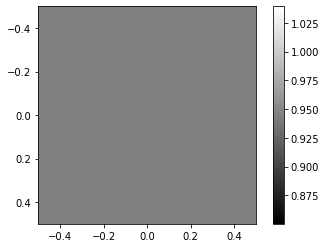

In [ ]:
# Create a heatmap of the cosine similarity values
plt.imshow(cosine_sim, cmap='gray')

# Add a colorbar to indicate the scale of the similarity values
plt.colorbar()

# Show the plot
plt.show()

In [ ]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

gmm = GaussianMixture(n_components=2)
gmm.fit(np.vstack((heatmap.reshape(-1, 1), heatmap_1.reshape(-1, 1))))
labels = gmm.predict(heatmap.reshape(-1, 1))
labels_1 = gmm.predict(heatmap_1.reshape(-1, 1))
heatmap_comp_0 = heatmap.ravel()[labels == 0]
heatmap_comp_1 = heatmap.ravel()[labels == 1]
heatmap_1_comp_0 = heatmap_1.ravel()[labels_1 == 0]
heatmap_1_comp_1 = heatmap_1.ravel()[labels_1 == 1]





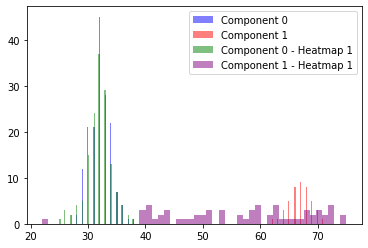

In [ ]:
import matplotlib.pyplot as plt

plt.hist(heatmap_comp_0, bins=50, alpha=0.5, color='blue', label='Component 0')
plt.hist(heatmap_comp_1, bins=50, alpha=0.5, color='red', label='Component 1')
plt.hist(heatmap_1_comp_0, bins=50, alpha=0.5, color='green', label='Component 0 - Heatmap 1')
plt.hist(heatmap_1_comp_1, bins=50, alpha=0.5, color='purple', label='Component 1 - Heatmap 1')
plt.legend()
plt.show()


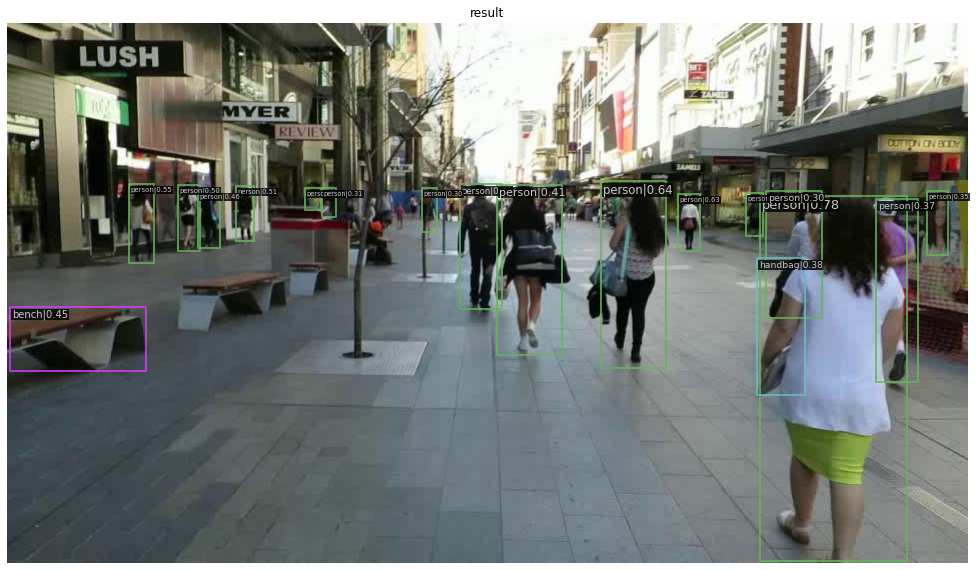

[[7.99483597e-01 1.84221998e-01 9.56342876e-01 5.72546363e-01
  6.90521323e-04]
 [4.80930239e-01 1.71854213e-01 5.25763392e-01 3.04904491e-01
  6.32292300e-04]
 [6.30716026e-01 1.68413118e-01 7.00093389e-01 3.66934299e-01
  5.40124311e-04]
 [7.12574661e-01 1.82218179e-01 7.35471010e-01 2.43151501e-01
  5.22039947e-04]
 [1.28480688e-01 1.71007499e-01 1.55912548e-01 2.55882114e-01
  4.39115771e-04]
 [2.42361709e-01 1.73460275e-01 2.62347460e-01 2.32046127e-01
  4.02531063e-04]
 [1.81386277e-01 1.72511175e-01 2.04063371e-01 2.42382795e-01
  3.87541542e-04]
 [2.02383995e-01 1.78876013e-01 2.25585282e-01 2.39235491e-01
  3.47685476e-04]
 [5.20107985e-01 1.72796190e-01 5.89386642e-01 3.53445619e-01
  2.94406229e-04]
 [3.16083163e-01 1.75454512e-01 3.32565963e-01 1.99048311e-01
  2.51647551e-04]
 [9.23332512e-01 1.87961340e-01 9.67298210e-01 3.81592989e-01
  2.50683021e-04]
 [7.85276830e-01 1.81543157e-01 8.02502692e-01 2.27050006e-01
  2.46537442e-04]
 [9.77710485e-01 1.78685516e-01 1.000000

In [ ]:
import cv2
import numpy as np
import torch
# Let's plot the result
from google.colab.patches import cv2_imshow
show_result_pyplot(model, img, result, score_thr=0.3)


#print(center_heatmap_preds)

#print(center_heatmap_target)
center_heatmap_preds = center_heatmap_preds- np.min(center_heatmap_preds)
center_heatmap_preds = center_heatmap_preds / np.max(center_heatmap_preds)
#cv2_imshow(center_heatmap_preds)
# Convert the heatmap to an 8-bit unsigned integer representation
#center_heatmap_preds = (center_heatmap_preds * 255).astype(np.uint8)
print(center_heatmap_preds)
# Display the heatmap
cv2_imshow(center_heatmap_preds)

import matplotlib.pyplot as plt

#plt.show()
#cv2.destroyAllWindows()





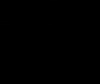

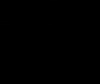

In [ ]:
center_heatmap_preds = center_heatmap_preds - np.min(center_heatmap_preds)
center_heatmap_preds = center_heatmap_preds / np.max(center_heatmap_preds)
cv2_imshow(center_heatmap_preds)
resized_heatmap = cv2.resize(center_heatmap_preds, (center_heatmap_preds.shape[1]*20, center_heatmap_preds.shape[0]*2), interpolation = cv2.INTER_CUBIC)
cv2_imshow(resized_heatmap)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2_imshow(resized_heatmap)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import cv2
import numpy as np
img_path = 'demo/1.png'
# get heat map from the model's output tensor
heat_map = model.predict(result)

# normalize heat map
heat_map = heat_map - np.min(heat_map)
heat_map = heat_map / np.max(heat_map)

# display heat map using OpenCV
cv2.imshow("Heat Map", heat_map)
cv2.waitKey(0)
cv2.destroyAllWindows()


AttributeError: ignored

## Train A Detector on A Customized Dataset

To train a new detector, there are usually three things to do:
1. Support a new dataset
2. Modify the config
3. Train a new detector



### Support a new dataset

There are three ways to support a new dataset in MMDetection: 
  1. Reorganize the dataset into a COCO format.
  2. Reorganize the dataset into a middle format.
  3. Implement a new dataset.

We recommend the first two methods, as they are usually easier than the third one.

In this tutorial, we give an example that converts the data into the formats of existing datasets, e.g. COCO, VOC, etc. Other methods and more advanced usages can be found in the [doc](https://mmdetection.readthedocs.io/en/latest/tutorials/customize_dataset.html#).

First, let's download a tiny dataset obtained from [KITTI](http://www.cvlibs.net/datasets/kitti/eval_object.php?obj_benchmark=3d). We select the first 75 images and their annotations from the 3D object detection dataset (it is the same dataset as the 2D object detection dataset but with 3D annotations). We convert the original images from PNG to JPEG format with 80% quality to reduce the size of the dataset.

In [ ]:
# download, decompress the data
!wget https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
!unzip kitti_tiny.zip > /dev/null

--2022-02-08 11:33:06--  https://download.openmmlab.com/mmdetection/data/kitti_tiny.zip
Resolving download.openmmlab.com (download.openmmlab.com)... 47.245.16.66
Connecting to download.openmmlab.com (download.openmmlab.com)|47.245.16.66|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6918271 (6.6M) [application/zip]
Saving to: ‘kitti_tiny.zip’

kitti_tiny.zip      100%[===================>]   6.60M  4.69MB/s    in 1.4s    

2022-02-08 11:33:09 (4.69 MB/s) - ‘kitti_tiny.zip’ saved [6918271/6918271]



In [ ]:
# Check the directory structure of the tiny data

# Install tree first
!apt-get -q install tree
!tree kitti_tiny

Reading package lists...
Building dependency tree...
Reading state information...
The following packages were automatically installed and are no longer required:
  cuda-command-line-tools-10-0 cuda-command-line-tools-10-1
  cuda-command-line-tools-11-0 cuda-compiler-10-0 cuda-compiler-10-1
  cuda-compiler-11-0 cuda-cuobjdump-10-0 cuda-cuobjdump-10-1
  cuda-cuobjdump-11-0 cuda-cupti-10-0 cuda-cupti-10-1 cuda-cupti-11-0
  cuda-cupti-dev-11-0 cuda-documentation-10-0 cuda-documentation-10-1
  cuda-documentation-11-0 cuda-documentation-11-1 cuda-gdb-10-0 cuda-gdb-10-1
  cuda-gdb-11-0 cuda-gpu-library-advisor-10-0 cuda-gpu-library-advisor-10-1
  cuda-libraries-10-0 cuda-libraries-10-1 cuda-libraries-11-0
  cuda-memcheck-10-0 cuda-memcheck-10-1 cuda-memcheck-11-0 cuda-nsight-10-0
  cuda-nsight-10-1 cuda-nsight-11-0 cuda-nsight-11-1 cuda-nsight-compute-10-0
  cuda-nsight-compute-10-1 cuda-nsight-compute-11-0 cuda-nsight-compute-11-1
  cuda-nsight-systems-10-1 cuda-nsight-systems-11-0 cuda-nsig

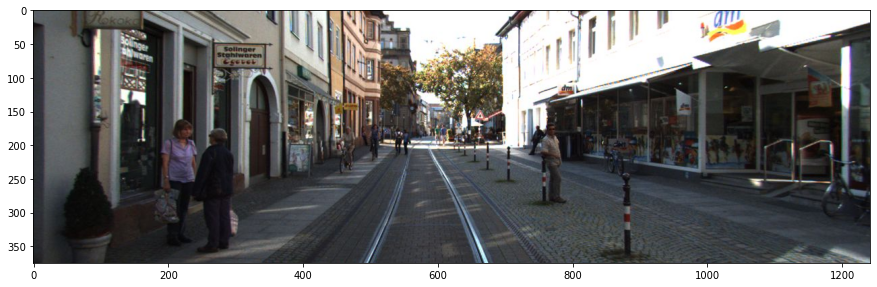

In [ ]:
# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('kitti_tiny/training/image_2/000073.jpeg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

After downloading the data, we need to implement a function to convert the KITTI annotation format into the middle format. In this tutorial, we choose to convert them in **`load_annotations`** function in a newly implemented **`KittiTinyDataset`**.

Let's take a loot at the annotation txt file.



In [ ]:
# Check the label of a single image
!cat kitti_tiny/training/label_2/000000.txt

Pedestrian 0.00 0 -0.20 712.40 143.00 810.73 307.92 1.89 0.48 1.20 1.84 1.47 8.41 0.01


According to the KITTI's documentation, the first column indicates the class of the object, and the 5th to 8th columns indicate the bboxes. We need to read annotations of each image and convert them into middle format that MMDetection can accept, as follows:

```python
[
    {
        'filename': 'a.jpg',
        'width': 1280,
        'height': 720,
        'ann': {
            'bboxes': <np.ndarray> (n, 4) in (x1, y1, x2, y2) order,
            'labels': <np.ndarray> (n, ),
            'bboxes_ignore': <np.ndarray> (k, 4), (optional field)
            'labels_ignore': <np.ndarray> (k, 4) (optional field)
        }
    },
    ...
]
```

In [ ]:
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module()
class KittiTinyDataset(CustomDataset):

    CLASSES = ('Car', 'Pedestrian', 'Cyclist')

    def load_annotations(self, ann_file):
        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            filename = f'{self.img_prefix}/{image_id}.jpeg'
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            data_info = dict(filename=f'{image_id}.jpeg', width=width, height=height)
    
            # load annotations
            label_prefix = self.img_prefix.replace('image_2', 'label_2')
            lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
            content = [line.strip().split(' ') for line in lines]
            bbox_names = [x[0] for x in content]
            bboxes = [[float(info) for info in x[4:8]] for x in content]
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

### Modify the config

In the next step, we need to modify the config for the training.
To accelerate the process, we finetune a detector using a pre-trained detector.

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')

Given a config that trains a Faster R-CNN on COCO dataset, we need to modify some values to use it for training Faster R-CNN on KITTI dataset. We modify the config of datasets, learning rate schedules, and runtime settings.

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'KittiTinyDataset'
cfg.data_root = 'kitti_tiny/'

cfg.data.test.type = 'KittiTinyDataset'
cfg.data.test.data_root = 'kitti_tiny/'
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'training/image_2'

cfg.data.train.type = 'KittiTinyDataset'
cfg.data.train.data_root = 'kitti_tiny/'
cfg.data.train.ann_file = 'train.txt'
cfg.data.train.img_prefix = 'training/image_2'

cfg.data.val.type = 'KittiTinyDataset'
cfg.data.val.data_root = 'kitti_tiny/'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'training/image_2'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')


Config:
model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cro

### Train a new detector

Finally, lets initialize the dataset and detector, then train a new detector! We use the high-level API `train_detector` implemented by MMDetection. This is also used in our training scripts. For details of the implementation, please see [here](https://github.com/open-mmlab/mmdetection/blob/master/mmdet/apis/train.py).

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

/content/mmdetection/mmdet/datasets/custom.py:180: UserWarning: CustomDataset does not support filtering empty gt images.
  'CustomDataset does not support filtering empty gt images.')
2022-02-08 11:38:22,273 - mmdet - INFO - load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
2022-02-08 11:38:22,406 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([4]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([12, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copyin

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 25/25, 9.7 task/s, elapsed: 3s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-02-08 11:40:51,306 - mmdet - INFO - 
+------------+-----+------+--------+-------+
| class      | gts | dets | recall | ap    |
+------------+-----+------+--------+-------+
| Car        | 62  | 129  | 0.968  | 0.869 |
| Pedestrian | 13  | 38   | 0.846  | 0.752 |
| Cyclist    | 7   | 51   | 0.571  | 0.123 |
+------------+-----+------+--------+-------+
| mAP        |     |      |        | 0.581 |
+------------+-----+------+--------+-------+
2022-02-08 11:40:51,309 - mmdet - INFO - Epoch(val) [12][25]	AP50: 0.5810, mAP: 0.5813


### Understand the log
From the log, we can have a basic understanding on the training process and know how well the detector is trained.

First, since the dataset we are using is small, we loaded a pre-trained Faster R-CNN model and fine-tune it for detection. 
The original Faster R-CNN is trained on COCO dataset that contains 80 classes but KITTI Tiny dataset only have 3 classes. Therefore, the last FC layers of the pre-trained Faster R-CNN for classification and regression have different weight shape and are not used.

Second, after training, the detector is evaluated by the default VOC-style evaluation. The results show that the detector achieves 58.1 mAP on the val dataset, not bad!

We can also check the tensorboard to see the curves.

In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./tutorial_exps

<IPython.core.display.Javascript object>

From the tensorboard, we can observe that changes of loss and learning rate. We can see the losses of each branch gradually decrease as the training goes by.

## Test the Trained Detector

After finetuning the detector, let's visualize the prediction results!

/content/mmdetection/mmdet/datasets/utils.py:69: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


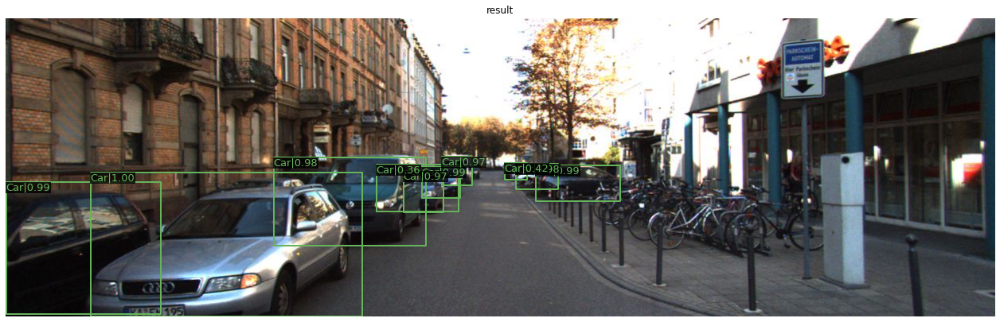

In [ ]:
img = mmcv.imread('kitti_tiny/training/image_2/000068.jpeg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)


## What to Do Next?

So far, we have learnt how to test and train a two-stage detector using MMDetection. To further explore MMDetection, you could do several other things as shown below:

- Try single-stage detectors, e.g., [RetinaNet](https://github.com/open-mmlab/mmdetection/tree/master/configs/retinanet) and [SSD](https://github.com/open-mmlab/mmdetection/tree/master/configs/ssd) in [MMDetection model zoo](https://github.com/open-mmlab/mmdetection/blob/master/docs/en/model_zoo.md). Single-stage detectors are more commonly used than two-stage detectors in industry.
- Try anchor-free detectors, e.g., [FCOS](https://github.com/open-mmlab/mmdetection/tree/master/configs/fcos) and [RepPoints](https://github.com/open-mmlab/mmdetection/tree/master/configs/reppoints) in [MMDetection model zoo](https://github.com/open-mmlab/mmdetection/blob/master/docs/en/model_zoo.md). Anchor-free detector is a new trend in the object detection community.
- Try 3D object detection using [MMDetection3D](https://github.com/open-mmlab/mmdetection3d), also one of the OpenMMLab projects. In MMDetection3D, not only can you try all the methods supported in MMDetection but also some 3D object detectors.
